# Домашнее задание 3. VAE + NF + VAPNEV

### Загрузка данных
В данном задании вам предстоит снова работать с CelebA

Решением домашки является архив с использованными тетрадками/модулями, а так же .pdf файл с отчетом по проделанной работе по каждому пункту задачи. В нем необходимо описать какие эксперименты вы производили чтобы получить результат который вы получили, а так же обосновать почему вы решили использовать штуки которые вы использовали (например, дополнительные лоссы для стабилизации, разные виды потоков, разные хаки для вае)



In [ ]:
# # Для работы в колабе раскоменьте эти строки
# !git clone https://github.com/HSE-LAMBDA/DeepGenerativeModels.git
# %cd DeepGenerativeModels/

In [ ]:
#!g1.1

from celeba import CelebADataset
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
import math
from tqdm.auto import trange, tqdm
import os 
from torch import nn

from torch import Tensor

In [3]:
#!g1.1
t_normalize = lambda x: x * 2 - 1
t_invnormalize = lambda x: (x + 1) / 2
transform=transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    t_normalize,
])

In [5]:
cuda = torch.cuda.is_available()
device = torch.device("cuda" if cuda else ("mps" if torch.backends.mps.is_available() else "cpu"))
torch.backends.cudnn.benchmark = cuda

In [7]:
#!g1.1
from random import randint

class CelebaCustomDataset(CelebADataset):
    def __getitem__(self, idx):
        image, target = super().__getitem__(idx)
        return image

batch_size = 128

dataset = CelebaCustomDataset(
    transform=transform
)
dataloader = torch.utils.data.DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True, drop_last=True, pin_memory=cuda)

img = dataset[0]
img.shape

torch.Size([3, 64, 64])

### Визуализация датасета

In [8]:
#!g1.1
def plot_img(img, transform):
    plt.imshow(transform(img).permute(1, 2, 0))
    plt.axis('off')

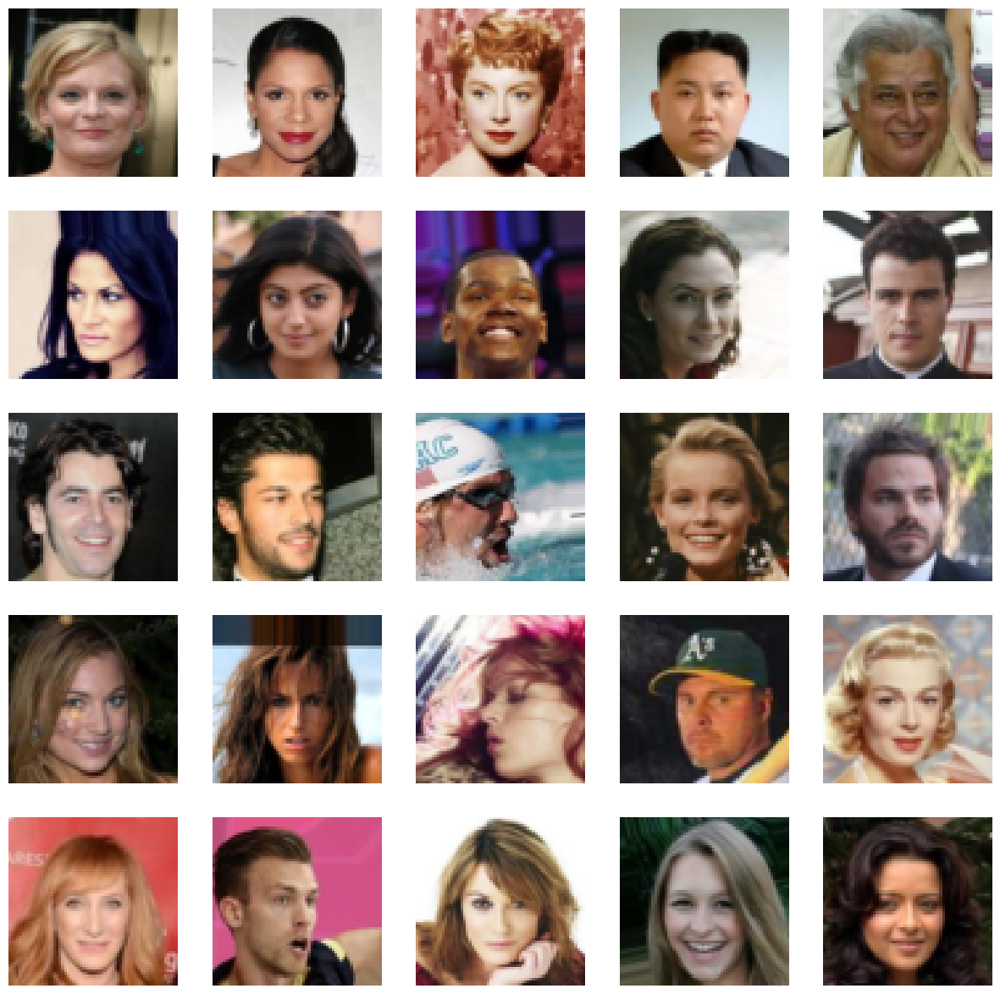

In [9]:
#!g1.1
plt.figure(figsize=(15, 15))

for i in range(25):
    img = dataset[np.random.randint(len(dataset))]
    plt.subplot(5, 5, i + 1)
    plot_img(img, t_invnormalize)
plt.show()

### Задача 1 (4/10 балла). Построить и обучить нормпоток на CelebA

Здесь нужно обучить нормпоток до нормального (трешхолды будут позже) качества, померить FID и Negative Log Likelihood и запомнить для будущего сравнения

Внутри потока можно использовать все что вы хотите, Coupling/Autoregressive/Linear слои, любые трансформации и все что вам приходит в голову. Но все что вы используете - напишите сами, без копипаста.

Можно использовать как и сверточные потоки (будут лучше, но сложнее писать), так и линейные (будут хуже), развернув селебу в один вектор.

В принципе можно использовать тот код который уже есть в репозитории курса, но лучше написать свой

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CouplingLayer(nn.Module):
    def __init__(self, in_channels, hidden_channels):
        super(CouplingLayer, self).__init__()
        
        self.net = nn.Sequential(
            nn.Conv2d(in_channels // 2, hidden_channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(hidden_channels, hidden_channels, kernel_size=1),
            nn.ReLU(),
            nn.Conv2d(hidden_channels, in_channels, kernel_size=3, padding=1)
        )
        
        self.net[-1].weight.data.zero_()
        self.net[-1].bias.data.zero_()

    def forward(self, x, reverse=False):
        x_a, x_b = x.chunk(2, dim=1)
        
        if not reverse:
            log_s_t = self.net(x_b)
            log_s, t = log_s_t.chunk(2, dim=1)
            s = torch.sigmoid(log_s + 2)
            y_a = s * x_a + t
            y_b = x_b
            return torch.cat([y_a, y_b], dim=1), torch.sum(torch.log(s).view(x.shape[0], -1), 1, keepdim=True)
        else:
            log_s_t = self.net(x_b)
            log_s, t = log_s_t.chunk(2, dim=1)
            s = torch.sigmoid(log_s + 2)
            y_a = (x_a - t) / s
            y_b = x_b
            return torch.cat([y_a, y_b], dim=1)


class NormalizingFlow(nn.Module):
    def __init__(self, in_channels, hidden_channels, num_layers):
        super(NormalizingFlow, self).__init__()
        
        self.layers = nn.ModuleList([
            CouplingLayer(in_channels, hidden_channels) for _ in range(num_layers)
        ])

    def forward(self, x, reverse=False):
        log_det = 0
        if not reverse:
            for layer in self.layers:
                x, ld = layer(x)
                log_det += ld
            return x, log_det
        else:
            for layer in reversed(self.layers):
                x = layer(x, reverse=True)
            return x




In [ ]:
import os
from tqdm import tqdm
import torch.optim as optim

def train_flow(model, dataloader, num_epochs=10, lr=1e-4, save_dir="normal_flow_checkpoints", load_checkpoint=None):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    
    os.makedirs(save_dir, exist_ok=True)
    
    if load_checkpoint is not None:
        if os.path.exists(load_checkpoint):
            checkpoint = torch.load(load_checkpoint, map_location=device)
            model.load_state_dict(checkpoint['model_state_dict'])
            optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            start_epoch = checkpoint['epoch']
            print(f"Loaded checkpoint successfuly.")
            return
        else:
            print(f"No checkpoint found at {load_checkpoint}, starting from scratch.")
            start_epoch = 0
    else:
        start_epoch = 0
    
    step = 0
    
    for epoch in range(start_epoch, num_epochs):
        model.train()
        pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}")
        for batch in pbar:
            batch = batch.to(device)
            optimizer.zero_grad()
            
            z, log_det = model(batch)
            
            log_pz = -0.5 * torch.sum(z**2, dim=[1, 2, 3])
            log_px = log_pz + log_det
            
            loss = -torch.mean(log_px)
            loss.backward()
            optimizer.step()
            
            pbar.set_postfix(loss=loss.item())
            
            step += 1
            if step % 100 == 0:
                checkpoint_path = os.path.join(save_dir, f"checkpoint_epoch_{epoch+1}_step_{step}.pt")
                torch.save({
                    'epoch': epoch + 1,
                    'step': step,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'loss': loss.item(),
                }, checkpoint_path)
                print(f"Checkpoint saved at {checkpoint_path}")
    
    final_checkpoint_path = os.path.join(save_dir, "final_checkpoint.pt")
    torch.save({
        'epoch': num_epochs,
        'step': step,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss.item(),
    }, final_checkpoint_path)
    print(f"Final checkpoint saved at {final_checkpoint_path}")

In [ ]:
model_flow = NormalizingFlow(in_channels=3, hidden_channels=64, num_layers=8)
train_flow(
    model_flow,
    dataloader,
    num_epochs=10,
    lr=1e-4,
    save_dir="normal_flow_checkpoints",
    load_checkpoint="normal_flow_checkpoints/final_checkpoint.pt"
)

Loaded checkpoint successfuly.


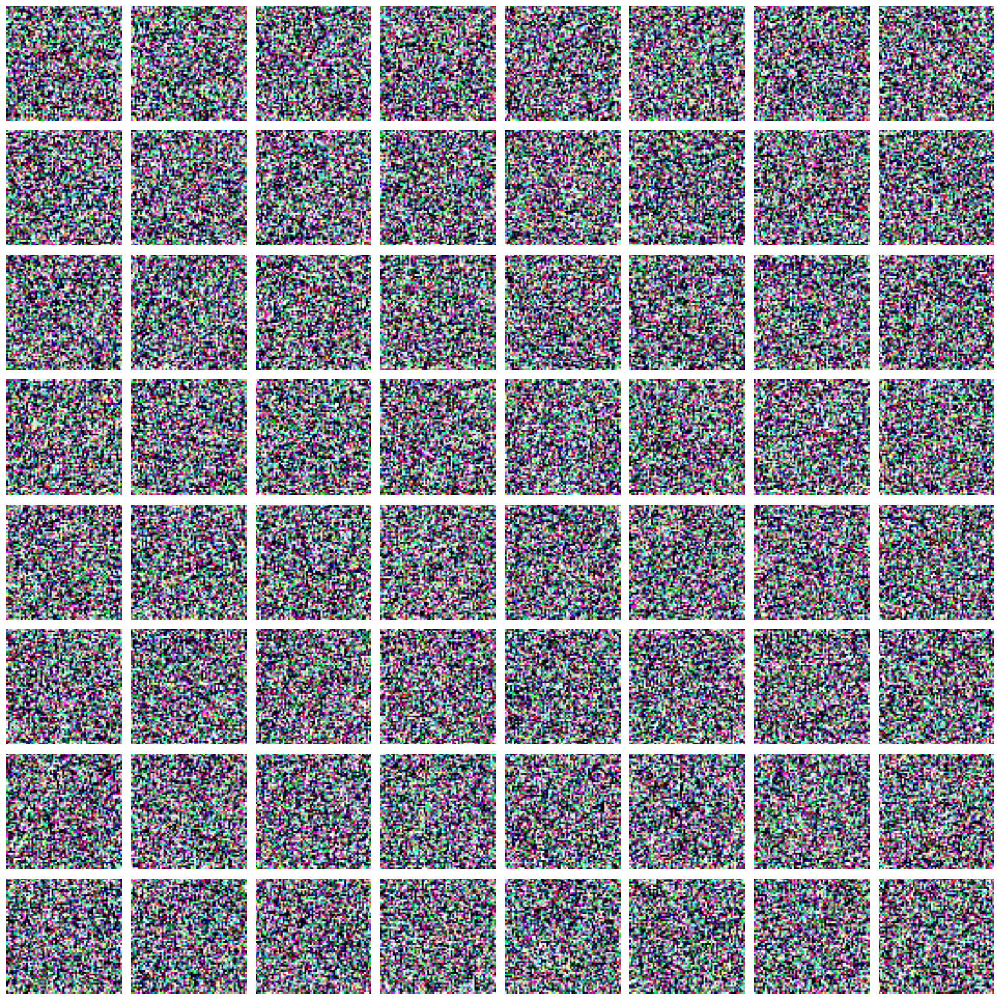

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np

def generate_images(model, num_images=64, image_size=(3, 64, 64)):
    device = next(model.parameters()).device
    z = torch.randn(num_images, *image_size).to(device)
    with torch.no_grad():
        generated_images = model(z, reverse=True)
    generated_images = generated_images.cpu()
    return generated_images

def plot_images(images, nrows=8, ncols=8):
    images = images.numpy()
    images = np.transpose(images, (0, 2, 3, 1))
    images = (images + 1) / 2
    images = np.clip(images, 0, 1)
    
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 2, nrows * 2))
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i])
        ax.axis("off")
    plt.tight_layout()
    plt.show()


model_flow = NormalizingFlow(in_channels=3, hidden_channels=64, num_layers=8)
model_flow.load_state_dict(torch.load("normal_flow_checkpoints/final_checkpoint.pt")["model_state_dict"])
model_flow.eval()

generated_images = generate_images(model_flow, num_images=64)


plot_images(generated_images, nrows=8, ncols=8)

Face's shapes are slightly visible, but we got a lot of noice

In [ ]:
import torch
import numpy as np
import os
import tempfile
from pytorch_fid import fid_score
from torchvision.utils import save_image

def generate_images(model, num_images=1000, image_size=(3, 64, 64)):
    device = next(model.parameters()).device
    z = torch.randn(num_images, *image_size).to(device)
    with torch.no_grad():
        generated_images = model(z, reverse=True)
    generated_images = generated_images.cpu()
    return generated_images

def compute_fid(model, dataloader, num_real_images=1000, num_fake_images=1000):
    device = next(model.parameters()).device
    

    fake_images = generate_images(model, num_images=num_fake_images)
    fake_images = (fake_images + 1) / 2 
    

    real_images = []
    for batch in dataloader:
        batch = batch.to(device)
        real_images.append(batch.cpu())
        if len(real_images) * batch.size(0) >= num_real_images:
            break
    real_images = torch.cat(real_images, dim=0)[:num_real_images]
    real_images = (real_images + 1) / 2
    

    with tempfile.TemporaryDirectory() as real_dir, tempfile.TemporaryDirectory() as fake_dir:

        for i, image in enumerate(real_images):
            save_image(image, os.path.join(real_dir, f"real_{i}.png"))

        for i, image in enumerate(fake_images):
            save_image(image, os.path.join(fake_dir, f"fake_{i}.png"))
        

        fid_value = fid_score.calculate_fid_given_paths(
            [real_dir, fake_dir],
            batch_size=64,
            device=device,
            dims=2048
        )
    
    return fid_value

In [28]:
model_flow.eval()

fid_value = compute_fid(model_flow, dataloader, num_real_images=10000, num_fake_images=10000)
print(f"FID: {fid_value}")

100%|██████████| 157/157 [03:31<00:00,  1.35s/it]


FID: 444.9310315339617


### Задача 2 (2/10 балла). Построить и обучить VAE на CelebA

Здесь нужно обучить VAE до нормального качества, померить FID и запомнить для будущего сравнения. 

В принципе можно использовать тот код который уже есть в репозитории курса, но лучше написать свой

Ради интереса, ваше вае тоже можно потестировать на маленьких датасетах


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from tqdm import tqdm

class Encoder(nn.Module):
    def __init__(self, input_channels, feature_maps, latent_dim, image_size):
        super(Encoder, self).__init__()
        self.downsampled_size = image_size // 16
        self.encoder = nn.Sequential(
            nn.Conv2d(input_channels, feature_maps, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(feature_maps),
            nn.Conv2d(feature_maps, feature_maps * 2, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(feature_maps * 2),
            nn.Conv2d(feature_maps * 2, feature_maps * 4, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(feature_maps * 4),
            nn.Conv2d(feature_maps * 4, feature_maps * 8, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.mean_layer = nn.Linear(feature_maps * 8 * self.downsampled_size * self.downsampled_size, latent_dim)
        self.logvar_layer = nn.Linear(feature_maps * 8 * self.downsampled_size * self.downsampled_size, latent_dim)

    def forward(self, x):
        batch_size = x.size(0)
        hidden = self.encoder(x).view(batch_size, -1)
        mean, logvar = self.mean_layer(hidden), self.logvar_layer(hidden)
        return mean, logvar

class Decoder(nn.Module):
    def __init__(self, input_channels, feature_maps, latent_dim, image_size):
        super(Decoder, self).__init__()
        self.feature_maps = feature_maps
        self.upsampled_size = image_size // 16
        self.decoder_dense = nn.Sequential(
            nn.Linear(latent_dim, feature_maps * 8 * self.upsampled_size * self.upsampled_size),
            nn.ReLU(inplace=True)
        )
        self.decoder_conv = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(feature_maps * 8, feature_maps * 4, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(feature_maps * 4),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(feature_maps * 4, feature_maps * 2, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(feature_maps * 2),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(feature_maps * 2, feature_maps, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.BatchNorm2d(feature_maps),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(feature_maps, input_channels, kernel_size=3, padding=1),
            nn.Tanh()
        )

    def forward(self, latent_vector):
        batch_size = latent_vector.size(0)
        hidden = self.decoder_dense(latent_vector).view(
            batch_size, self.feature_maps * 8, self.upsampled_size, self.upsampled_size
        )
        return self.decoder_conv(hidden)

class VAE(nn.Module):
    def __init__(self, input_channels=3, feature_maps=32, latent_dim=100, image_size=64):
        super(VAE, self).__init__()
        self.device = device
        self.latent_dim = latent_dim
        self.encoder = Encoder(input_channels, feature_maps, latent_dim, image_size)
        self.decoder = Decoder(input_channels, feature_maps, latent_dim, image_size)

    def forward(self, x):
        mean, logvar = self.encoder(x)
        latent_z = self.reparametrize(mean, logvar)
        reconstructed_x = self.decode(latent_z)
        return reconstructed_x, mean, logvar

    def encode(self, x):
        mean, logvar = self.encoder(x)
        latent_z = self.reparametrize(mean, logvar)
        return latent_z, mean, logvar

    def decode(self, latent_vector):
        return self.decoder(latent_vector)

    @staticmethod
    def reparametrize(mean, logvar):
        std_dev = torch.exp(0.5 * logvar)
        epsilon = torch.randn_like(std_dev)
        return mean + epsilon * std_dev

    def sample(self, num_samples):
        sample_z = torch.randn(num_samples, self.latent_dim).to(self.device)
        return self.decode(sample_z)


def loss_function(recon_x, x, mean, logvar, beta=1.0):
    batch_size = recon_x.shape[0]
    mse_loss = F.mse_loss(recon_x.view(batch_size, -1), x.view(batch_size, -1), reduction='sum') / batch_size
    kld_loss = -0.5 * torch.sum(1 + logvar - mean.pow(2) - torch.clamp(logvar.exp(), min=1e-8)) / batch_size
    kld_loss *= beta
    return mse_loss, kld_loss

def generate_samples(model, num_samples=64):
    with torch.no_grad():
        sample_images = model.sample(num_samples).cpu()
        image_grid = make_grid(sample_images, normalize=True)
        return image_grid

def display_images(image_grid, title):
    plt.figure(figsize=(8, 8))
    plt.imshow(image_grid.permute(1, 2, 0))
    plt.axis("off")
    plt.title(title)
    plt.show()

def train_vae(model, dataloader, optimizer, scheduler, epochs, device, log_interval=50):
    model.to(device)
    model.train()

    try:
        model.encoder.load_state_dict(torch.load('vae_checkpoints/encoder.pth'))
        model.decoder.load_state_dict(torch.load('vae_checkpoints/decoder.pth'))
        print("Weigts successufuly loaded")
        return
    except FileNotFoundError:
        print("File with weights not found. Starting trainig model.")

    with tqdm(total=epochs * len(dataloader), desc="Training Progress") as pbar:
        for epoch in range(1, epochs + 1):
            epoch_loss, epoch_mse, epoch_kld = 0, 0, 0

            for batch_idx, (data, _) in enumerate(dataloader):
                data = data.to(device)
                optimizer.zero_grad()

                recon_batch, mean, logvar = model(data)
                mse_loss, kld_loss = loss_function(recon_batch, data, mean, logvar)
                loss = mse_loss + kld_loss

                loss.backward()
                optimizer.step()

                epoch_loss += loss.item()
                epoch_mse += mse_loss.item()
                epoch_kld += kld_loss.item()

                if batch_idx % log_interval == 0:
                    pbar.set_description(
                        f"Epoch [{epoch}/{epochs}] | KL: {kld_loss.item()/len(data):.4f} | MSE: {mse_loss.item()/len(data):.4f}"
                    )

                pbar.update(1)

            avg_loss = epoch_loss / len(dataloader.dataset)
            avg_mse = epoch_mse / len(dataloader.dataset)
            avg_kld = epoch_kld / len(dataloader.dataset)

            print(f"\nEpoch {epoch}/{epochs} | Avg Loss: {avg_loss:.4f} | Avg MSE: {avg_mse:.4f} | Avg KL: {avg_kld:.4f}")

            scheduler.step()

            # Generate and visualize sample images after each epoch

            torch.save(model.encoder.state_dict(), 'vae_checkpoints/encoder.pth')
            torch.save(model.decoder.state_dict(), 'vae_checkpoints/decoder.pth')

In [ ]:
image_size = 64
batch_size = 128

# Define transformations
data_transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),  
    transforms.Normalize([0.5]*3, [0.5]*3),  # Normalize each channel
])

# Load dataset
dataset = CelebADataset(root_dir='seminars/data/celeba', transform=data_transform)
dataloader = torch.utils.data.DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True, drop_last=True, pin_memory=cuda)


epochs = 10
lr = 1e-3

vae_model = VAE().to(device)
optimizer = torch.optim.Adam(vae_model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_vae(vae_model, dataloader, optimizer, scheduler, epochs=epochs, device=device)

Weigts successufuly loaded


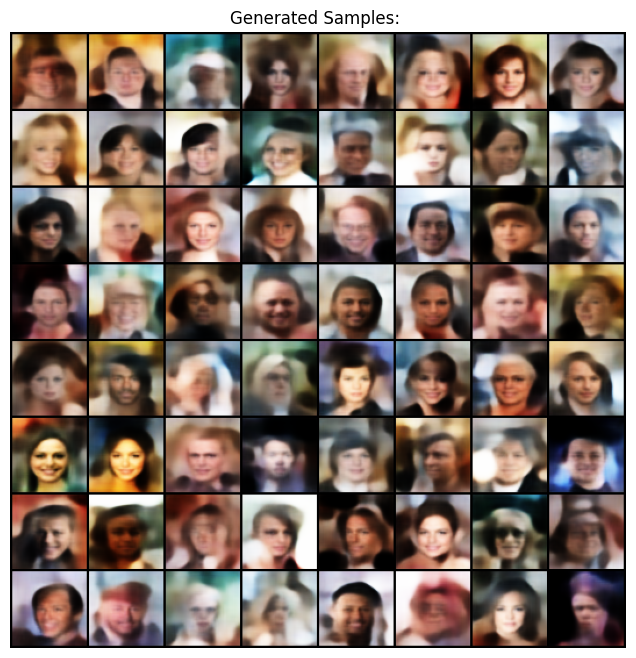

In [37]:
image_grid = generate_samples(vae_model)
display_images(image_grid, f"Generated Samples: ")

In [38]:
import torch
from torch.utils.data import DataLoader, Subset, TensorDataset
from scipy.linalg import sqrtm
import numpy as np

def get_representations(dataloader, encoder, device):
    representations = []

    encoder.eval()
    latent_size = encoder.mean_layer.out_features

    with torch.no_grad():
        for images in dataloader:
            images = images[0].to(device)
            mean, _ = encoder(images)
            vectorized_embeddings = mean.view(mean.size(0), latent_size)
            representations.append(vectorized_embeddings.cpu())

    return torch.cat(representations, dim=0)

def calculate_fid(repr1, repr2):
    repr1 = repr1.cpu().numpy()
    repr2 = repr2.cpu().numpy()

    m_r, m_g = repr1.mean(axis=0), repr2.mean(axis=0)
    diff = m_r - m_g
    diff_2 = np.sum(diff ** 2)

    s_r, s_g = np.cov(repr1, rowvar=False), np.cov(repr2, rowvar=False)
    cov = sqrtm(s_r @ s_g)

    if np.iscomplexobj(cov):
        cov = cov.real

    FID = diff_2 + np.trace(s_r) + np.trace(s_g) - 2 * np.trace(cov)
    return FID

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

encoder = vae_model.encoder

num_samples = 10000
indices = np.random.choice(len(dataset), num_samples, replace=False)
subset = Subset(dataset, indices)
dataloader = DataLoader(dataset=subset, batch_size=128, shuffle=False)


vae_real_activations = get_representations(dataloader, encoder, device)

vae_model.eval()
with torch.no_grad():
    generated_images = vae_model.sample(num_samples).cpu()

generated_dataset = TensorDataset(generated_images)
generated_dataloader = DataLoader(generated_dataset, batch_size=128, shuffle=False)

vae_fake_activations = get_representations(generated_dataloader, encoder, device)

vae_fid_score = calculate_fid(vae_real_activations, vae_fake_activations)
print(f"FID Score: {vae_fid_score:.4f}")

FID Score: 3.6311


### Задача 3 (6/10 балла). 

#### Задача 3.1 (4/10 балла) Построить и обучить VAPNEV на CelebA

Здесь нужно прочитать [статью про VAPNEV](https://arxiv.org/pdf/1611.05209.pdf), обучить его до нормального (трешхолды будут позже) качества, померить FID и запомнить для будущего сравнения. 

#### Задача 3.2 (2/10 балла). Построить и обучить conditional VAPNEV на CelebA

Вроде понятно из текста задачи. Что такое conditional VAPNEV, читайте в статье

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision.datasets import CelebA
from torchvision import transforms
from tqdm import tqdm
import numpy as np
from scipy.linalg import sqrtm
import matplotlib.pyplot as plt
from torchvision.models import inception_v3

class PlanarFlow(nn.Module):
    def __init__(self, dim):
        super(PlanarFlow, self).__init__()
        self.u = nn.Parameter(torch.randn(1, dim) * 0.01)
        self.w = nn.Parameter(torch.randn(1, dim) * 0.01)
        self.b = nn.Parameter(torch.randn(1) * 0.01)
    
    def forward(self, z):
        uw = torch.sum(self.u * self.w, dim=1)
        m_uw = -1 + torch.log1p(torch.exp(uw.clamp(max=10)))
        u_hat = self.u + (m_uw - uw) * self.w / (torch.sum(self.w ** 2) + 1e-6)
        inner = (z @ self.w.T + self.b).view(-1, 1)
        z_new = z + u_hat * torch.tanh(inner)
        psi = (1 - torch.tanh(inner) ** 2) * self.w
        log_det = torch.log(torch.abs(1 + torch.sum(psi * u_hat, dim=1)) + 1e-6)
        return z_new, log_det

class ConditionalVAPNEV(nn.Module):
    def __init__(self, latent_dim=128, num_flows=4, num_classes=2):
        super(ConditionalVAPNEV, self).__init__()
        self.label_emb = nn.Embedding(num_classes, latent_dim)
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, 4, stride=2, padding=1), nn.ReLU(),
            nn.Conv2d(32, 64, 4, stride=2, padding=1), nn.ReLU(),
            nn.Conv2d(64, 128, 4, stride=2, padding=1), nn.ReLU(),
            nn.Conv2d(128, 256, 4, stride=2, padding=1), nn.ReLU()
        )
        self.fc_mu = nn.Linear(256 * 4 * 4 + latent_dim, latent_dim)
        self.fc_logvar = nn.Linear(256 * 4 * 4 + latent_dim, latent_dim)
        self.fc_decode = nn.Linear(latent_dim + latent_dim, 256 * 4 * 4)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1), nn.ReLU(),
            nn.ConvTranspose2d(32, 3, 4, stride=2, padding=1), nn.Tanh()
        )
        self.flows = nn.ModuleList([PlanarFlow(3 * 64 * 64) for _ in range(num_flows)])
    
    def reparameterize(self, mu, logvar):
        logvar = logvar.clamp(max=10)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    
    def forward(self, x, labels):
        label_emb = self.label_emb(labels)
        h = self.encoder(x).view(x.size(0), -1)
        h = torch.cat([h, label_emb], dim=1)
        mu, logvar = self.fc_mu(h), self.fc_logvar(h)
        z = self.reparameterize(mu, logvar)
        z_cond = torch.cat([z, label_emb], dim=1)
        x_recon = self.fc_decode(z_cond).view(-1, 256, 4, 4)
        x_recon = self.decoder(x_recon).view(-1, 3 * 64 * 64)
        log_det_sum = 0
        z_flow = x_recon
        for flow in self.flows:
            z_flow, log_det = flow(z_flow)
            log_det_sum += log_det
        return z_flow.view(-1, 3, 64, 64), mu, logvar, log_det_sum

class VAPNEV(nn.Module):
    def __init__(self, latent_dim=128, num_flows=4):
        super(VAPNEV, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, 4, stride=2, padding=1), nn.ReLU(),
            nn.Conv2d(32, 64, 4, stride=2, padding=1), nn.ReLU(),
            nn.Conv2d(64, 128, 4, stride=2, padding=1), nn.ReLU(),
            nn.Conv2d(128, 256, 4, stride=2, padding=1), nn.ReLU()
        )
        self.fc_mu = nn.Linear(256 * 4 * 4, latent_dim)
        self.fc_logvar = nn.Linear(256 * 4 * 4, latent_dim)
        self.fc_decode = nn.Linear(latent_dim, 256 * 4 * 4)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1), nn.ReLU(),
            nn.ConvTranspose2d(32, 3, 4, stride=2, padding=1), nn.Tanh()
        )
        self.flows = nn.ModuleList([PlanarFlow(3 * 64 * 64) for _ in range(num_flows)])
    
    def reparameterize(self, mu, logvar):
        logvar = logvar.clamp(max=10)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    
    def forward(self, x):
        h = self.encoder(x).view(x.size(0), -1)
        mu, logvar = self.fc_mu(h), self.fc_logvar(h)
        z = self.reparameterize(mu, logvar)
        x_recon = self.fc_decode(z).view(-1, 256, 4, 4)
        x_recon = self.decoder(x_recon).view(-1, 3 * 64 * 64)
        log_det_sum = 0
        z_flow = x_recon
        for flow in self.flows:
            z_flow, log_det = flow(z_flow)
            log_det_sum += log_det
        return z_flow.view(-1, 3, 64, 64), mu, logvar, log_det_sum

def vapnev_loss(recon_x, x, mu, logvar, log_det_sum):
    batch_size = x.size(0)
    recon_loss = nn.functional.mse_loss(recon_x, x, reduction='sum') / batch_size
    kl_div = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
    log_det_mean = log_det_sum.mean()
    return recon_loss + kl_div - log_det_mean

def calculate_fid(model, dataloader, num_samples=100, device='cpu', conditional=False):
    inception_model = inception_v3(pretrained=True, transform_input=False).to(device)
    inception_model.eval()
    
    def get_features(images, model):
        with torch.no_grad():
            images = t_invnormalize(images)
            images = images.to(device)
            if images.shape[1] != 3:
                images = images[:, :3, :, :]
            images = torch.nn.functional.interpolate(images, size=(299, 299), mode='bilinear', align_corners=False)
            pred = model(images)
            return pred.cpu().numpy()

    model.eval()
    with torch.no_grad():
        z = torch.randn(num_samples, 128).to(device)
        if conditional:
            labels = torch.cat([torch.zeros(num_samples // 2), torch.ones(num_samples // 2)]).long().to(device)
            label_emb = model.label_emb(labels)
            z_cond = torch.cat([z, label_emb], dim=1)
            x_recon = model.decoder(model.fc_decode(z_cond).view(-1, 256, 4, 4)).view(-1, 3 * 64 * 64)
        else:
            x_recon = model.decoder(model.fc_decode(z).view(-1, 256, 4, 4)).view(-1, 3 * 64 * 64)
        for flow in model.flows:
            x_recon, _ = flow(x_recon)
        fake_images = x_recon.view(-1, 3, 64, 64)
    
    real_images = []
    for i, (images, _) in enumerate(dataloader):
        if len(real_images) * dataloader.batch_size >= num_samples:
            break
        real_images.append(images)
    real_images = torch.cat(real_images, dim=0)[:num_samples]
    
    real_features = get_features(real_images, inception_model)
    fake_features = get_features(fake_images, inception_model)
    
    mu_real, sigma_real = np.mean(real_features, axis=0), np.cov(real_features, rowvar=False)
    mu_fake, sigma_fake = np.mean(fake_features, axis=0), np.cov(fake_features, rowvar=False)
    diff = mu_real - mu_fake
    covmean = sqrtm(sigma_real.dot(sigma_fake))
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    fid = diff.dot(diff) + np.trace(sigma_real + sigma_fake - 2 * covmean)
    
    return fid, fake_images

def display_generated_images(images, fid_score, num_display=64, title='Generated Images'):
    images = t_invnormalize(images)
    plt.figure(figsize=(15, 15))
    for i in range(min(num_display, len(images))):
        plt.subplot(8, 8, i+1)
        img = images[i].cpu().permute(1, 2, 0).numpy()
        plt.imshow(img)
        plt.axis('off')
    plt.suptitle(f'{title}\nFID Score: {fid_score}')
    plt.show()


def train_conditional_vapnev(model, dataloader, num_epochs=5, num_batches=700, device='cpu'):
    try:
        model.load_state_dict(torch.load('cond_vapnev_checks/model.pth'))
        print(f"Model loaded")
    except FileNotFoundError:
        print(f"No model found, starting from scratch")
    
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        print(f'Epoch {epoch}...')
        for i, (images, labels) in tqdm(enumerate(dataloader), total=num_batches):
            if i >= num_batches:
                break
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            recon_images, mu, logvar, log_det_sum = model(images, labels)
            loss = vapnev_loss(recon_images, images, mu, logvar, log_det_sum)
            if torch.isnan(loss):
                print("NaN detected in loss")
                break
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            total_loss += loss.item()
        if torch.isnan(loss):
            break
        print(f"Epoch {epoch+1}, Loss: {total_loss/len(dataloader.dataset)}")
        torch.save(model.state_dict(), 'cond_vapnev_checks/model.pth')

def train_vapnev(model, dataloader, num_epochs=5, num_batches=700, device='cpu'):

    try:
        model.load_state_dict(torch.load('vapnev_checkpoints/model.pth'))
        print(f"Model loaded")
    except FileNotFoundError:
        print(f"No model found, starting from scratch")

    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        print(f'Epoch {epoch}...')
        for i, (images, _) in tqdm(enumerate(dataloader), total=num_batches):
            if i >= num_batches:
                break
            images = images.to(device)
            optimizer.zero_grad()
            recon_images, mu, logvar, log_det_sum = model(images)
            loss = vapnev_loss(recon_images, images, mu, logvar, log_det_sum)
            if torch.isnan(loss):
                print("NaN detected in loss")
                break
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            total_loss += loss.item()
        if torch.isnan(loss):
            break
        print(f"Epoch {epoch+1}, Loss: {total_loss/len(dataloader.dataset)}")
        torch.save(model.state_dict(), 'vapnev_checkpoints/model.pth')


In [56]:

transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])


class CelebaCustomDataset(CelebADataset):
    def __getitem__(self, idx):
        image, target = super().__getitem__(idx)
        label = torch.tensor(1 if target.get('Smiling', 0) > 0 else 0, dtype=torch.long)
        return image, label

batch_size = 128

dataset = CelebaCustomDataset(
    transform=transform
)

dataloader_with_labels = DataLoader(
    dataset, batch_size=128, shuffle=True, num_workers=0
)

### Vapnev

In [49]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

vapnev_model = VAPNEV(latent_dim=128, num_flows=4).to(device)
train_vapnev(vapnev_model, dataloader_with_labels, num_epochs=10, num_batches=len(dataloader_with_labels), device=device)

No model found, starting from scratch
Epoch 0...


100%|██████████| 6332/6332 [07:27<00:00, 14.14it/s]


Epoch 1, Loss: 13.95196289535781
Epoch 1...


100%|██████████| 6332/6332 [07:24<00:00, 14.25it/s]


Epoch 2, Loss: 8.39899512216915
Epoch 2...


100%|██████████| 6332/6332 [06:59<00:00, 15.11it/s]


Epoch 3, Loss: 7.765770633358158
Epoch 3...


100%|██████████| 6332/6332 [06:39<00:00, 15.86it/s]


Epoch 4, Loss: 7.542446803899296
Epoch 4...


100%|██████████| 6332/6332 [07:19<00:00, 14.39it/s]


Epoch 5, Loss: 7.3932111950985515
Epoch 5...


100%|██████████| 6332/6332 [07:59<00:00, 13.20it/s]


Epoch 6, Loss: 7.317126307449995
Epoch 6...


100%|██████████| 6332/6332 [07:14<00:00, 14.56it/s]


Epoch 7, Loss: 7.257810265924511
Epoch 7...


100%|██████████| 6332/6332 [06:56<00:00, 15.19it/s]


Epoch 8, Loss: 7.222120482877859
Epoch 8...


100%|██████████| 6332/6332 [06:50<00:00, 15.42it/s]


Epoch 9, Loss: 7.183122297409591
Epoch 9...


100%|██████████| 6332/6332 [06:55<00:00, 15.22it/s]

Epoch 10, Loss: 7.154287026178791


In [53]:
fid_score, generated_images = calculate_fid(vapnev_model, dataloader_with_labels, num_samples=64, device=device, conditional=False)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0023434758..0.97981286].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0015758276..0.97709596].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029172063..0.97677994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.006006986..1.0086646].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.006924331..0.9669591].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.033570528..0.99130875].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got

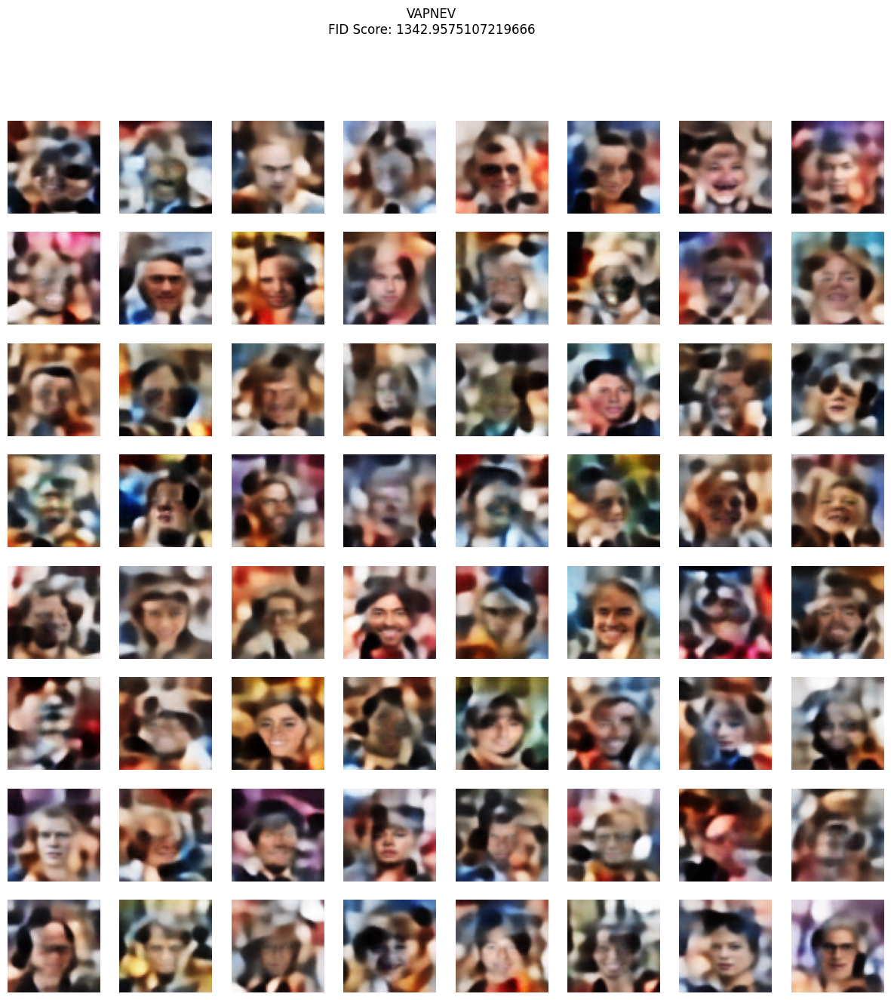

In [54]:
display_generated_images(generated_images, fid_score, title='VAPNEV')

In [55]:
print(f"VAPNEV FID Score: {fid_score}")

VAPNEV FID Score: 1342.9575107219666


### Conditional Vapnev

In [58]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

cond_vapnev = ConditionalVAPNEV(latent_dim=128, num_flows=4, num_classes=2).to(device)
train_conditional_vapnev(cond_vapnev, dataloader_with_labels, num_epochs=10, num_batches=len(dataloader_with_labels), device=device)

No model found, starting from scratch
Epoch 0...


100%|██████████| 1583/1583 [04:12<00:00,  6.28it/s]


Epoch 1, Loss: 5.143123284307148
Epoch 1...


100%|██████████| 1583/1583 [04:39<00:00,  5.66it/s]


Epoch 2, Loss: 2.5161643863952294
Epoch 2...


100%|██████████| 1583/1583 [04:45<00:00,  5.54it/s]


Epoch 3, Loss: 2.0996768157913643
Epoch 3...


100%|██████████| 1583/1583 [04:41<00:00,  5.62it/s]


Epoch 4, Loss: 1.9442577004219088
Epoch 4...


100%|██████████| 1583/1583 [04:20<00:00,  6.09it/s]


Epoch 5, Loss: 1.8820362951258456
Epoch 5...


100%|██████████| 1583/1583 [04:33<00:00,  5.79it/s]


Epoch 6, Loss: 1.8413265399368846
Epoch 6...


100%|██████████| 1583/1583 [04:35<00:00,  5.75it/s]


Epoch 7, Loss: 1.8084212157007722
Epoch 7...


100%|██████████| 1583/1583 [04:30<00:00,  5.85it/s]


Epoch 8, Loss: 1.7898637510272033
Epoch 8...


100%|██████████| 1583/1583 [04:41<00:00,  5.62it/s]


Epoch 9, Loss: 1.7744560524696174
Epoch 9...


100%|██████████| 1583/1583 [04:47<00:00,  5.50it/s]

Epoch 10, Loss: 1.7620877861621818


In [59]:
fid_score, generated_images = calculate_fid(cond_vapnev, dataloader_with_labels, num_samples=64, device=device, conditional=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.031726062..1.0130367].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.029642463..1.0103977].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0077014565..1.0030427].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.023543924..1.001241].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0035823584..0.98995316].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0044386983..1.0008063].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range 

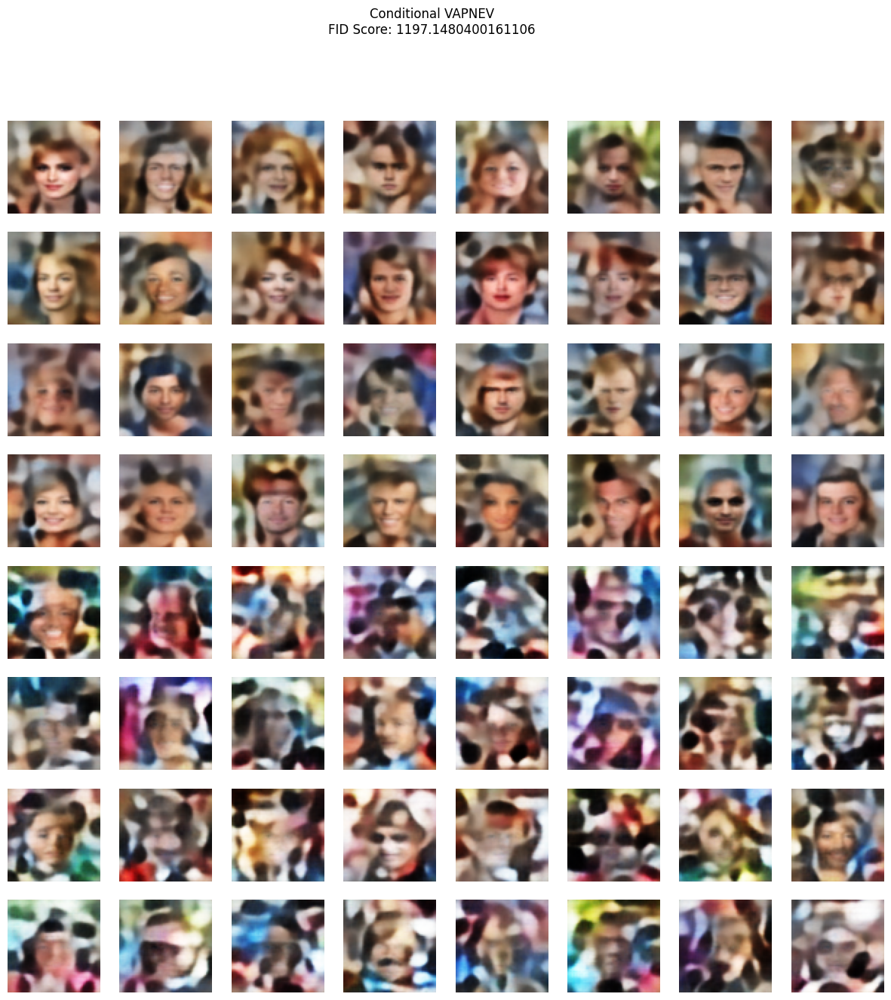

In [60]:
display_generated_images(generated_images, fid_score, title='Conditional VAPNEV')

In [61]:
print(f"Conditional VAPNEV FID Score: {fid_score}")

Conditional VAPNEV FID Score: 1197.1480400161106


### Задача 4. (1/10 балла) Анализ

* Анализ латентного пространства и визуально качественный результат - **1 балл**
1. Посмотрите у какой модели получается лучшая интерполяция в латентном пространстве
2. Попробуйте взять внешнюю картинку (не из селебы), отмапить ее с латентное пространство и покажите ближайшие к ней.
3. Покажите самый смешной результат генерации который у вас получался

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7882353..0.8901961].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7647059..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.92941177..0.9137255].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.92941177..0.85882354].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9843137..1.0].


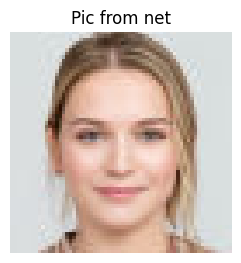

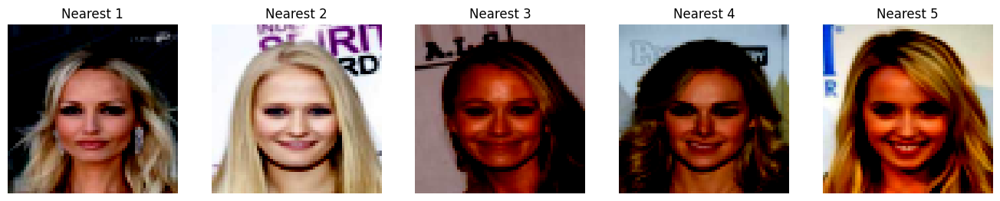

In [ ]:
from PIL import Image
import torch
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Subset

def encode_image(model, image, device):
    return model.encode(image.unsqueeze(0).to(device))

def calculate_distances(z_external, dataloader, model, device):
    distances = []
    all_images = []
    for batch in dataloader:
        images = batch[0].to(device)
        z, _, _ = model.encode(images)
        batch_distances = torch.norm(z_external - z, dim=1).detach().cpu().numpy()
        distances.extend(batch_distances)
        all_images.extend(images.cpu())
    return distances, all_images

def display_images(external_image, nearest_images, num_neighbors):
    plt.figure(figsize=(20, 20))
    plt.subplot(1, num_neighbors + 1, 1)
    plt.imshow(external_image.permute(1, 2, 0).cpu().numpy())
    plt.title("Pic from net")
    plt.axis("off")
    plt.show

    plt.figure(figsize=(20, 80))
    for i, img in enumerate(nearest_images):
        plt.subplot(1, num_neighbors + 1, i + 2)
        plt.imshow(img.permute(1, 2, 0).numpy())
        plt.title(f"Nearest {i + 1}")
        plt.axis("off")
    plt.show()

def find_nearest_images(model, external_image, subset, device, num_neighbors=5):
    z_external, _, _ = encode_image(model, external_image, device)
    dataloader = DataLoader(dataset=subset, batch_size=128, shuffle=False)
    distances, all_images = calculate_distances(z_external, dataloader, model, device)
    nearest_indices = np.argsort(distances)[:num_neighbors]
    nearest_images = [all_images[i] for i in nearest_indices]
    display_images(external_image, nearest_images, num_neighbors)

def load_and_transform_image(image_path, transform, device):
    image = Image.open(image_path)
    if image.mode == "RGBA":
        image = image.convert("RGB")
    return transform(image).to(device)

def create_random_subset(dataset, num_samples):
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    return Subset(dataset, indices)

transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x[:3])
])

image_path = "pic_resized.jpg"
external_image = load_and_transform_image(image_path, transform, device)

num_samples = 1000
subset = create_random_subset(dataset, num_samples)

find_nearest_images(vae_model, external_image, subset, device)

### Задача 0. Отчет

Чтобы получить полный балл за каждый из пунктов вам нужно включить в отчет (который сдатеся отдельно в виде pdf) примеры (лучше - много примеров) генерации вашей модели. 

Сравните результаты разных моделей, попробуйте обьяснить почему одна сработала лучше чем другая.